<a href="https://colab.research.google.com/github/pranathimulaka/License-Plate-Recognition/blob/main/License_Plate_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Problem Statement: License Plate Recognition : Detecting and recognizing vehicle license plates represents a widely recognized challenge that has garnered significant attention.**

**IMPORTING THE LIBRARIES**

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import easyocr
import requests
from google.colab.patches import cv2_imshow
from io import BytesIO
from PIL import Image

In [ ]:
!pip install easyocr

**Licplatesdetection**

**A COLLECTION OF VEICLE IMAGES(Bounding Boxes  Encapsulating The License Plates Within Each Image) With Character Recognition On These License Plates**

In [ ]:
# read annotation file
df = pd.read_csv("/content/Licplatesdetection_train.csv")
print(df)

      img_id  ymin  xmin  ymax  xmax
0      1.jpg   276    94   326   169
1     10.jpg   311   395   344   444
2    100.jpg   406   263   450   434
3    101.jpg   283   363   315   494
4    102.jpg   139    42   280   222
..       ...   ...   ...   ...   ...
895   95.jpg   426    34   508   140
896   96.jpg   356   378   457   548
897   97.jpg   229   149   283   217
898   98.jpg   272   252   300   383
899   99.jpg    53   503   217   569

[900 rows x 5 columns]


**PRE-PROCESSING THE DATA AND UNDERSTANDING THE DATA**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   img_id  900 non-null    object
 1   ymin    900 non-null    int64 
 2   xmin    900 non-null    int64 
 3   ymax    900 non-null    int64 
 4   xmax    900 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 35.3+ KB


In [ ]:
df.shape

(900, 5)

In [ ]:
df.isnull().sum()

img_id    0
ymin      0
xmin      0
ymax      0
xmax      0
dtype: int64

**FINDING THE BOUNDING BOX FOR THE SPECIFIEE IMAGE ID ONLY PLATE NUMBER AND  DATA ANALYSIS**


94 276 169 326
(477, 850, 3)


<ipython-input-43-5d90bbba20ca>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


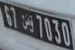

In [ ]:
# 1

img_bbox = df.loc[df['img_id']=='1.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("1.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 94 276 169 326
Image shape: (477, 850, 3)


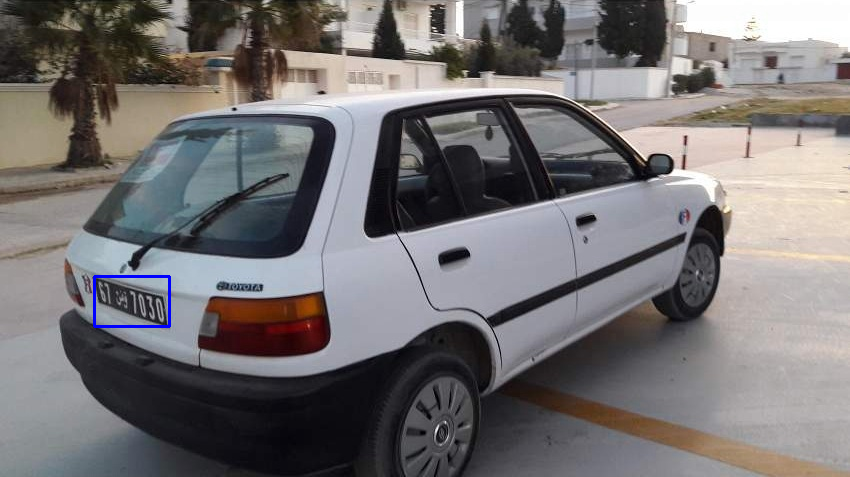

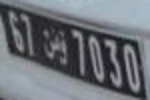

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '1.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "1.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image


In [ ]:
# 2

img_bbox = df.loc[df['img_id']=='2.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/2.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

96 297 209 324
(547, 307, 3)


<ipython-input-11-ab32aad2cfde>:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 96 297 209 324
Image shape: (547, 307, 3)


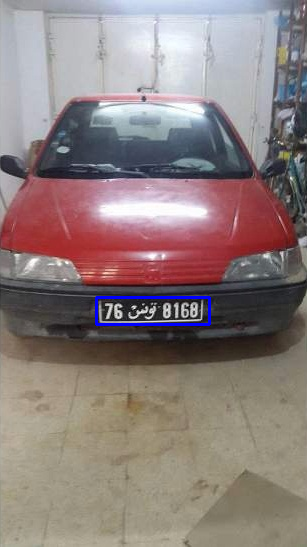

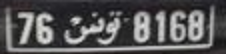

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '2.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/2.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image


In [ ]:
# 3

img_bbox = df.loc[df['img_id']=='3.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/3.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

216 525 397 547
(547, 729, 3)


<ipython-input-18-2ad0b6a634b4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 216 525 397 547
Image shape: (547, 729, 3)


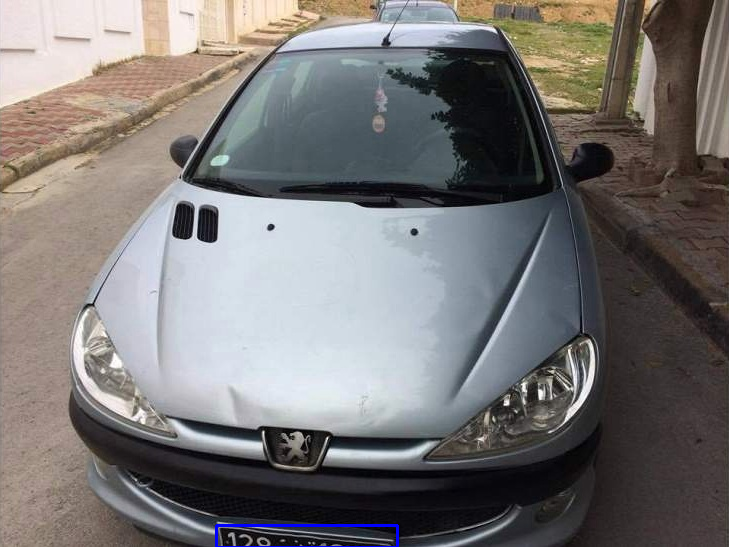

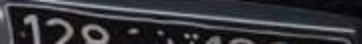

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '3.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/3.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image


In [ ]:
# 4

img_bbox = df.loc[df['img_id']=='4.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/4.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

131 190 216 210
(479, 359, 3)


<ipython-input-19-ed49e6d25855>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 131 190 216 210
Image shape: (479, 359, 3)


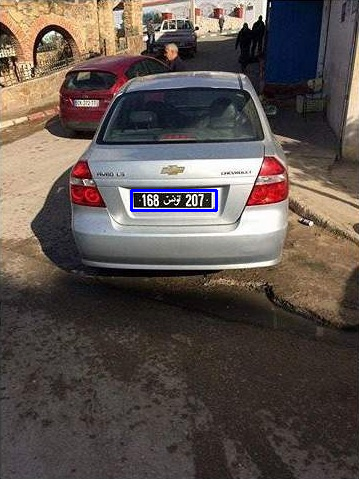

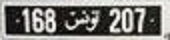

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '4.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/4.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

48 359 148 406
(547, 821, 3)


<ipython-input-20-db2dbb629c01>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


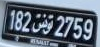

In [ ]:
# 5

img_bbox = df.loc[df['img_id']=='5.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/5.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 48 359 148 406
Image shape: (547, 821, 3)


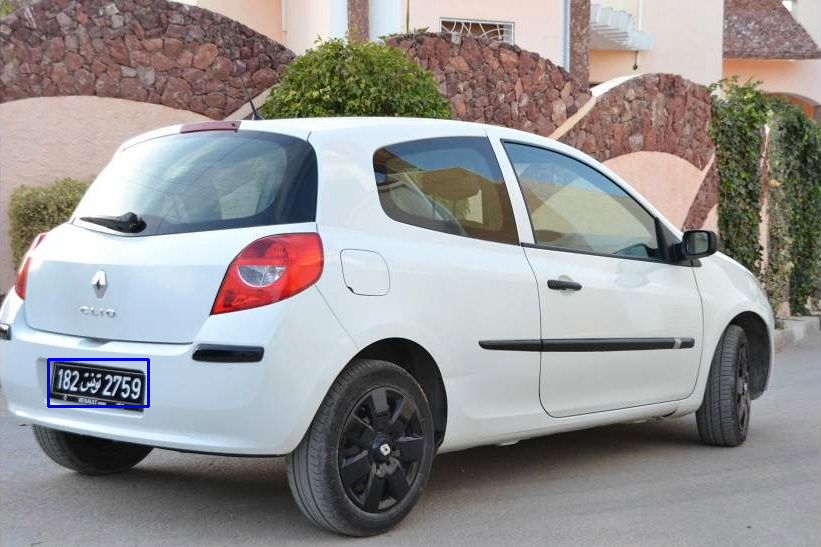

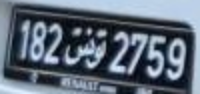

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '5.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/5.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

273 506 465 539
(547, 729, 3)


<ipython-input-64-f634fd7c5c51>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


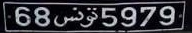

In [ ]:
# 6

img_bbox = df.loc[df['img_id']=='6.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/6.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 273 506 465 539
Image shape: (547, 729, 3)


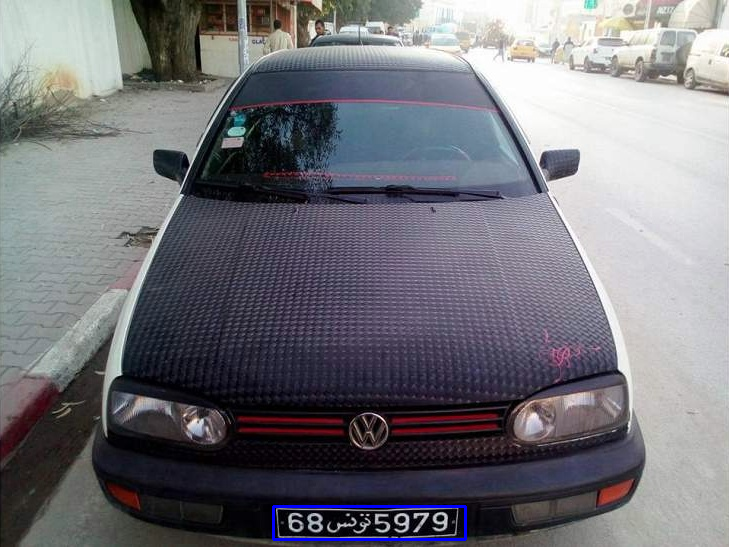

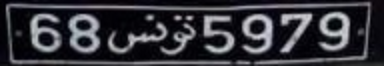

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '6.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/6.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

In [ ]:
# 7

img_bbox = df.loc[df['img_id']=='7.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/7.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

154 409 290 436
(547, 410, 3)


<ipython-input-65-2434a4f56596>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 154 409 290 436
Image shape: (547, 410, 3)


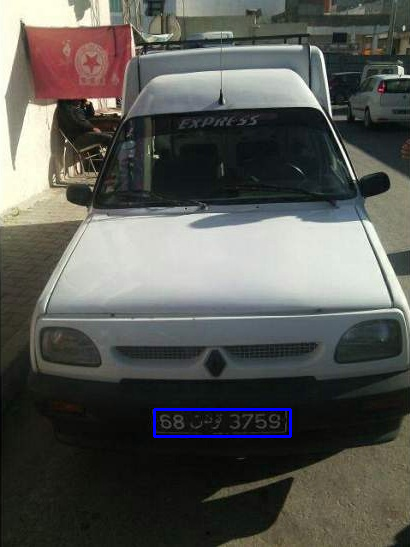

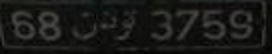

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '7.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/7.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

In [ ]:
# 8

img_bbox = df.loc[df['img_id']=='8.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/8.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

159 289 273 317
(444, 410, 3)


<ipython-input-21-9242210b5dda>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 159 289 273 317
Image shape: (444, 410, 3)


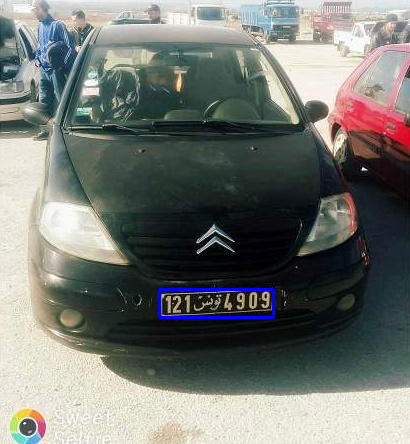

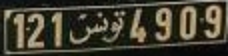

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '8.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/8.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

In [ ]:
# 9

img_bbox = df.loc[df['img_id']=='9.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/9.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

433 146 458 316
(477, 850, 3)


<ipython-input-76-393fa453ecdd>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 433 146 458 316
Image shape: (477, 850, 3)


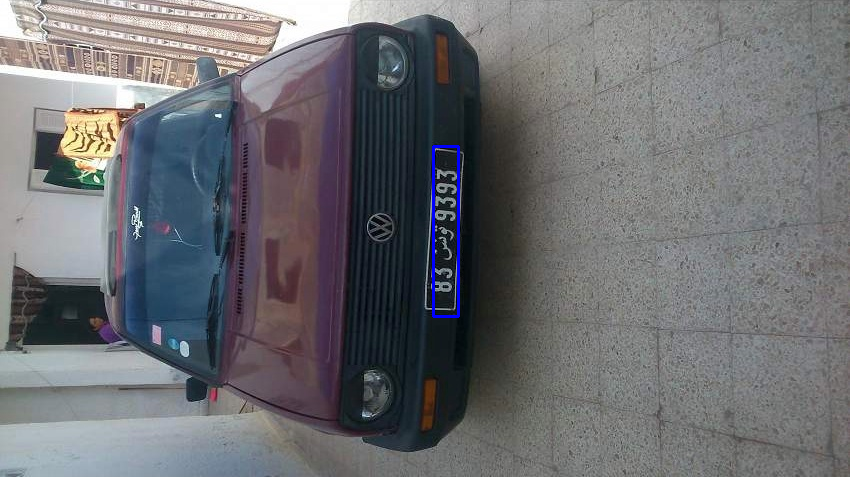

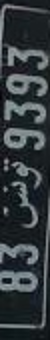

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '9.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/9.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

395 311 444 344
(479, 639, 3)


<ipython-input-78-c124cbe6c2cc>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


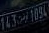

In [ ]:
# 10

img_bbox = df.loc[df['img_id']=='10.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/10.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 395 311 444 344
Image shape: (479, 639, 3)


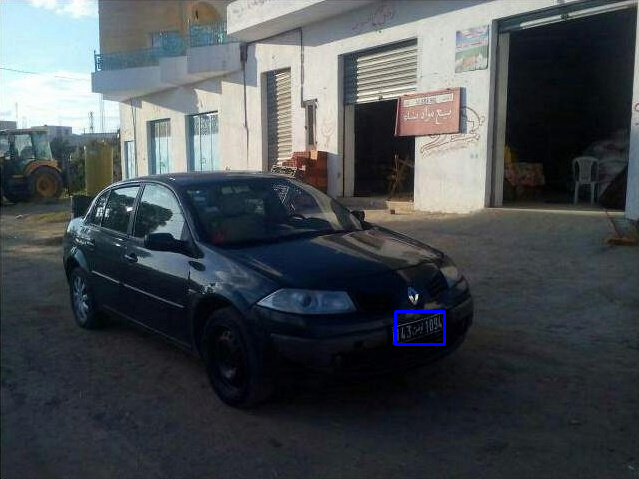

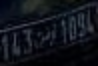

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '10.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/10.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

359 378 545 421
(547, 821, 3)


<ipython-input-23-b7f4f80ade9a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


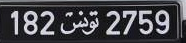

In [ ]:
# 11

img_bbox = df.loc[df['img_id']=='11.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/11.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 359 378 545 421
Image shape: (547, 821, 3)


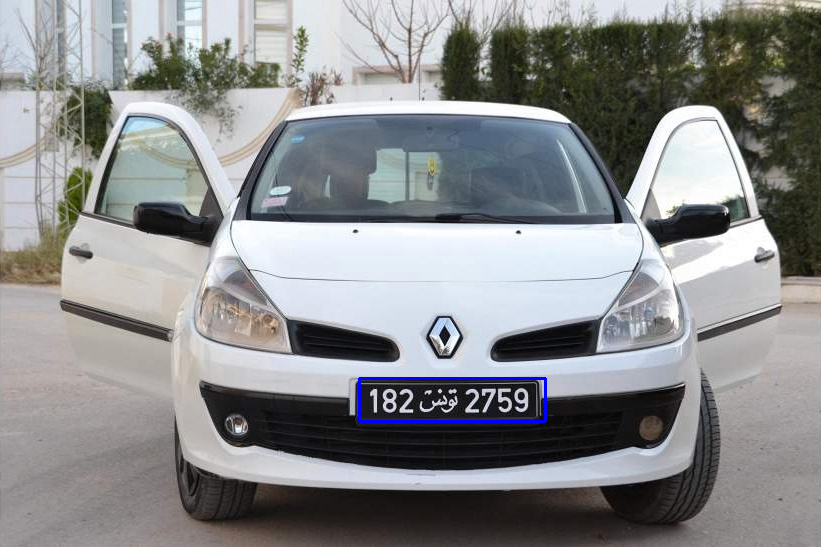

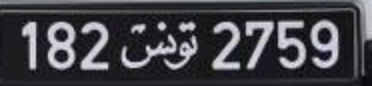

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/11.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

In [ ]:
# 12

img_bbox = df.loc[df['img_id']=='12.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/12.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 243 402 385 450
Image shape: (477, 850, 3)


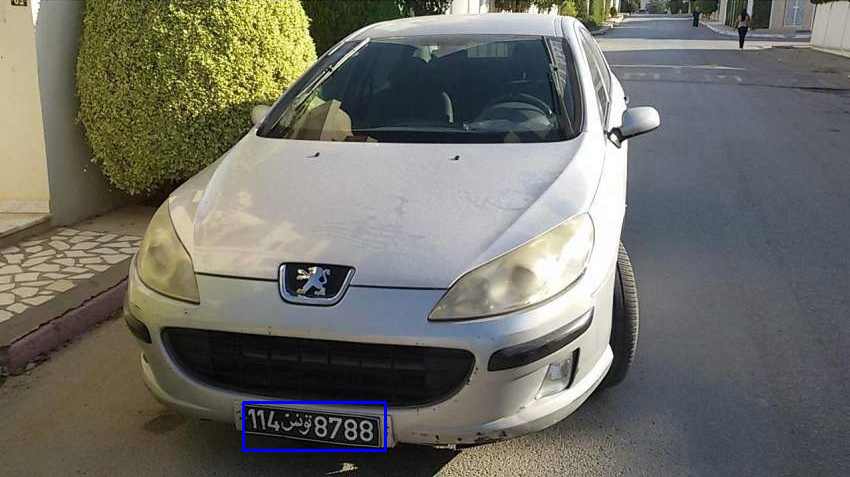

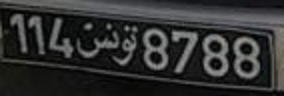

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '12.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/12.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

285 347 562 397
(477, 850, 3)


<ipython-input-26-f45557e2800e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


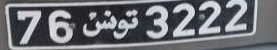

In [ ]:
# 13

img_bbox = df.loc[df['img_id']=='13.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/13.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 285 347 562 397
Image shape: (477, 850, 3)


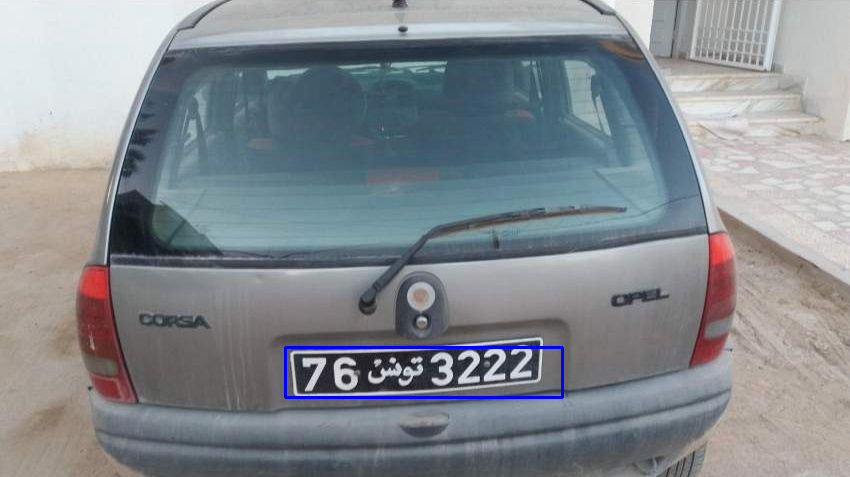

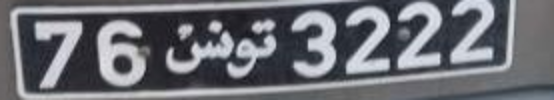

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '13.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/13.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

289 376 501 417
(479, 639, 3)


<ipython-input-28-3aa5e3569079>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


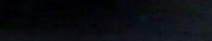

In [ ]:
# 14

img_bbox = df.loc[df['img_id']=='14.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/10.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 289 376 501 417
Image shape: (477, 850, 3)


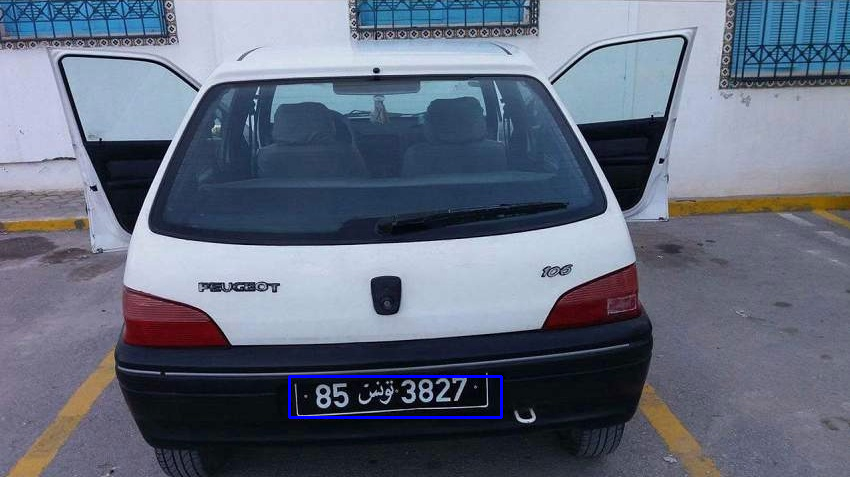

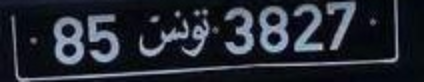

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '14.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/14.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

In [ ]:
# 15

img_bbox = df.loc[df['img_id']=='15.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/15.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

69 379 190 405
(547, 410, 3)


<ipython-input-30-327a42a8b9bf>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


Bounding box coordinates: 69 379 190 405
Image shape: (547, 410, 3)


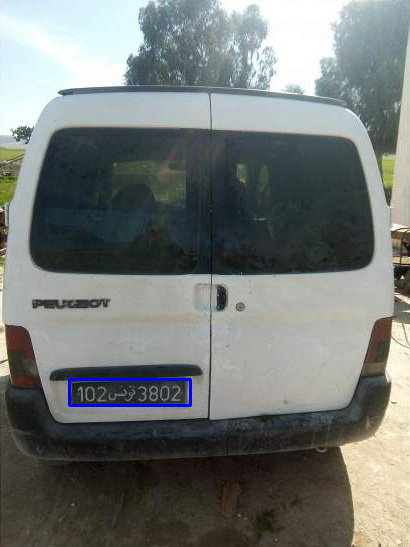

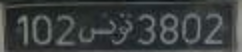

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '15.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/15.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

255 314 428 359
(547, 729, 3)


<ipython-input-32-f793ef4030c7>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


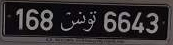

In [ ]:
# 16

img_bbox = df.loc[df['img_id']=='16.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/16.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 255 314 428 359
Image shape: (547, 729, 3)


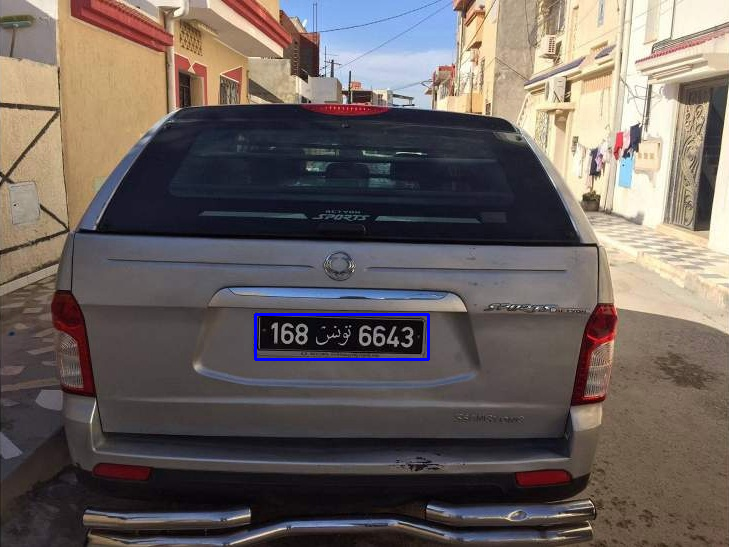

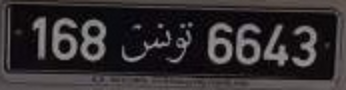

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '16.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/16.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

200 397 380 498
(509, 850, 3)


<ipython-input-34-8e13a6615fe1>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


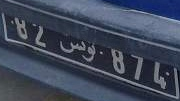

In [ ]:
# 17

img_bbox = df.loc[df['img_id']=='17.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/17.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 200 397 380 498
Image shape: (509, 850, 3)


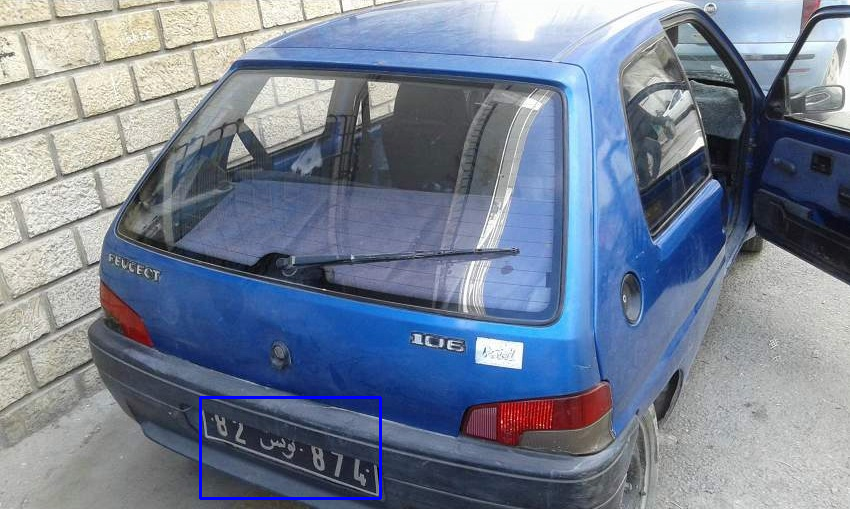

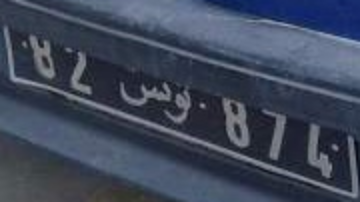

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '17.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/17.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

354 176 395 348
(547, 729, 3)


<ipython-input-37-283fd28970f8>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


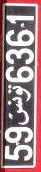

In [ ]:
# 18

img_bbox = df.loc[df['img_id']=='18.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/18.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 354 176 395 348
Image shape: (547, 729, 3)


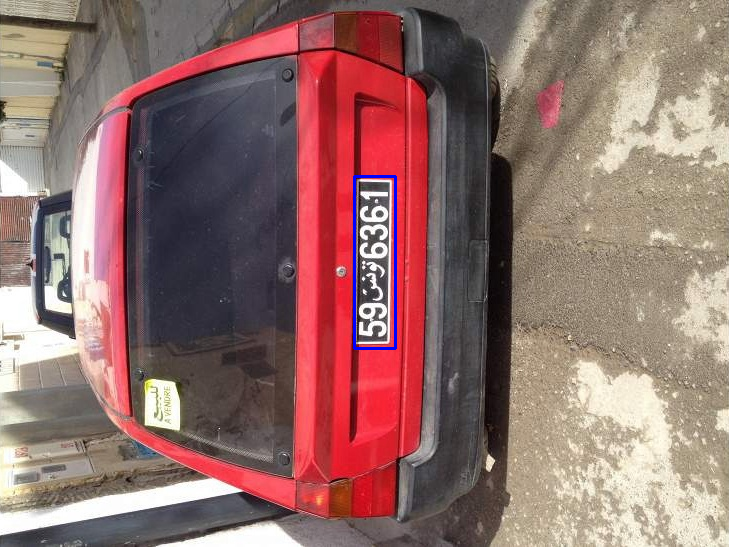

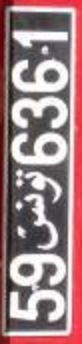

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '18.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/18.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

96 263 206 301
(547, 307, 3)


<ipython-input-39-fe47060a4872>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


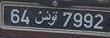

In [ ]:
# 19

img_bbox = df.loc[df['img_id']=='19.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/19.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 96 263 206 301
Image shape: (547, 307, 3)


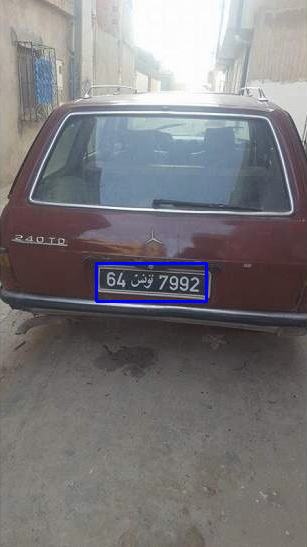

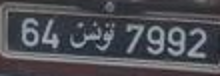

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '19.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/19.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

153 232 192 270
(404, 719, 3)


<ipython-input-41-9aef698d233f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


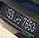

In [ ]:
# 20

img_bbox = df.loc[df['img_id']=='20.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/20.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

Bounding box coordinates: 153 232 192 270
Image shape: (404, 719, 3)


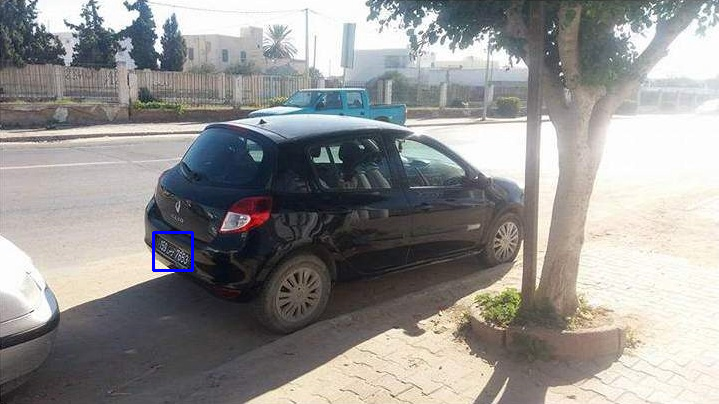

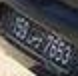

In [ ]:
# Load the DataFrame with bounding box coordinates
df = pd.read_csv("/content/Licplatesdetection_train.csv")  # Replace "path_to_csv_file.csv" with the actual path

# Find the bounding box for the specified image ID
img_bbox = df.loc[df['img_id'] == '20.jpg']

if img_bbox.empty:
    print("No bounding box found for the specified image ID.")
else:
    # Extract bounding box coordinates
    x_min = int(img_bbox["xmin"].values[0])
    y_min = int(img_bbox["ymin"].values[0])
    x_max = int(img_bbox["xmax"].values[0])
    y_max = int(img_bbox["ymax"].values[0])
    print("Bounding box coordinates:", x_min, y_min, x_max, y_max)

    # Load the image
    img_path = "/content/20.jpg"  # Update with the correct image path
    img = cv2.imread(img_path)
    if img is None:
        print("Failed to load image. Please check the file path.")
    else:
        print("Image shape:", img.shape)

        # Visualize the bounding box on the original image
        img_with_bbox = img.copy()
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2_imshow(img_with_bbox)

        # Crop the region
        plate = img[y_min:y_max, x_min:x_max]

        # Resize the cropped image to increase its size
        scale_factor = 2  # Increase this factor to make the image larger
        plate_resized = cv2.resize(plate, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
        cv2_imshow(plate_resized)  # Display the resized cropped image

300 432 494 473
(547, 729, 3)


<ipython-input-53-6a76509967b5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


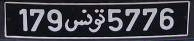

In [ ]:
# 21

img_bbox = df.loc[df['img_id']=='21.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/21.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 22

img_bbox = df.loc[df['img_id']=='22.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/22.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

162 236 262 256
(547, 410, 3)


<ipython-input-54-f723350bd483>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


85 289 190 321
(547, 410, 3)


<ipython-input-55-84887c1fd5e6>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


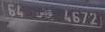

In [ ]:
# 23

img_bbox = df.loc[df['img_id']=='23.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/23.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

258 434 507 491
(547, 729, 3)


<ipython-input-56-34013de07deb>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


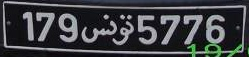

In [ ]:
# 24

img_bbox = df.loc[df['img_id']=='24.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/24.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 25

img_bbox = df.loc[df['img_id']=='25.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/25.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

72 290 191 319
(547, 409, 3)


<ipython-input-57-27a68a650e9e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


153 232 192 270
(477, 850, 3)


<ipython-input-58-ed2e88bd9b5f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


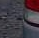

In [ ]:
# 26

img_bbox = df.loc[df['img_id']=='20.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/26.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

592 182 665 215
(477, 850, 3)


<ipython-input-59-b59b646dd435>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


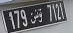

In [ ]:
# 27

img_bbox = df.loc[df['img_id']=='27.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/27.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 28

img_bbox = df.loc[df['img_id']=='28.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/28.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

319 300 455 330
(477, 850, 3)


<ipython-input-60-cacd7d57c5e9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 29

img_bbox = df.loc[df['img_id']=='29.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/29.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

353 198 478 226
(477, 850, 3)


<ipython-input-61-50ad12ea9ba8>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 30

img_bbox = df.loc[df['img_id']=='30.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/30.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

276 237 404 265
(547, 732, 3)


<ipython-input-62-e0a778a9d18f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 31

img_bbox = df.loc[df['img_id']=='31.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/31.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

129 337 240 357
(547, 307, 3)


<ipython-input-63-1b4164584cf7>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


292 324 409 437
(547, 410, 3)


<ipython-input-64-362c5aadedf2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


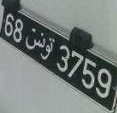

In [ ]:
# 32

img_bbox = df.loc[df['img_id']=='32.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/32.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

305 407 492 443
(547, 824, 3)


<ipython-input-67-325f407a8931>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


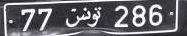

In [ ]:
# 33

img_bbox = df.loc[df['img_id']=='33.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/33.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 34

img_bbox = df.loc[df['img_id']=='34.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/34.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

287 246 348 276
(547, 410, 3)


<ipython-input-68-10984c6d641a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


219 397 394 461
(547, 729, 3)


<ipython-input-69-d4eeac3fca41>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


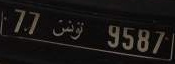

In [ ]:
# 35

img_bbox = df.loc[df['img_id']=='35.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/35.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

363 382 530 422
(476, 850, 3)


<ipython-input-70-a7cb95d465f1>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


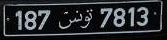

In [ ]:
# 36

img_bbox = df.loc[df['img_id']=='36.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/36.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 37

img_bbox = df.loc[df['img_id']=='37.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/37.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

140 355 243 380
(547, 410, 3)


<ipython-input-71-a22e715fafe9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


322 436 518 472
(477, 850, 3)


<ipython-input-72-f796b333f6b5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


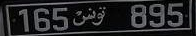

In [ ]:
# 38

img_bbox = df.loc[df['img_id']=='38.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/38.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 39

img_bbox = df.loc[df['img_id']=='39.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/39.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

99 365 211 382
(547, 307, 3)


<ipython-input-73-639f394cdbd5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 40

img_bbox = df.loc[df['img_id']=='40.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/40.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

163 288 240 302
(547, 410, 3)


<ipython-input-74-a9e86348b8cc>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


153 232 192 270
(404, 719, 3)


<ipython-input-75-9aef698d233f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


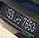

In [ ]:
# 41

img_bbox = df.loc[df['img_id']=='41.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/41.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

577 118 609 203
(477, 850, 3)


<ipython-input-76-acd783edc132>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


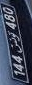

In [ ]:
# 42

img_bbox = df.loc[df['img_id']=='42.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/42.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

251 282 336 319
(547, 410, 3)


<ipython-input-77-be3f3e769a26>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


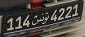

In [ ]:
# 43

img_bbox = df.loc[df['img_id']=='43.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/43.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

287 380 458 423
(547, 729, 3)


<ipython-input-78-2c65f21db76e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


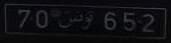

In [ ]:
# 44

img_bbox = df.loc[df['img_id']=='44.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/44.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

150 258 226 306
(546, 730, 3)


<ipython-input-79-cdf311d03629>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


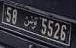

In [ ]:
# 45

img_bbox = df.loc[df['img_id']=='45.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/45.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

141 374 277 412
(547, 410, 3)


<ipython-input-80-760e2a027849>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


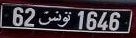

In [ ]:
# 46

img_bbox = df.loc[df['img_id']=='46.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/46.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 47

img_bbox = df.loc[df['img_id']=='47.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/47.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

83 299 176 324
(547, 307, 3)


<ipython-input-81-56534508eaed>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


234 320 559 393
(540, 779, 3)


<ipython-input-82-2d31259bb72e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


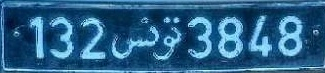

In [ ]:
# 48

img_bbox = df.loc[df['img_id']=='48.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/48.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

255 151 327 257
(522, 410, 3)


<ipython-input-83-ac5084a1750c>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


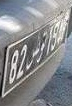

In [ ]:
# 49

img_bbox = df.loc[df['img_id']=='49.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/49.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

164 405 291 451
(547, 761, 3)


<ipython-input-84-7a1105c50ff9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


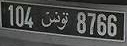

In [ ]:
# 50

img_bbox = df.loc[df['img_id']=='50.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/50.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 51

img_bbox = df.loc[df['img_id']=='51.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/51.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

425 339 505 362
(473, 850, 3)


<ipython-input-85-06d724357e23>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 52

img_bbox = df.loc[df['img_id']=='52.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/52.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

327 418 557 457
(477, 850, 3)


<ipython-input-86-5c75cf3ff834>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


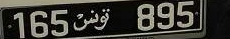

In [ ]:
# 53

img_bbox = df.loc[df['img_id']=='53.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/53.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

698 167 759 267
(477, 850, 3)


<ipython-input-87-9f7b88215c63>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


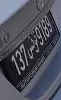

In [ ]:
# 54

img_bbox = df.loc[df['img_id']=='54.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/54.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

319 298 454 331
(477, 850, 3)


<ipython-input-89-2e2604280973>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


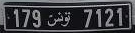

In [ ]:
# 55

img_bbox = df.loc[df['img_id']=='55.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/55.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

388 288 438 421
(477, 850, 3)


<ipython-input-90-078321cbec91>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


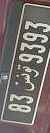

In [ ]:
# 56

img_bbox = df.loc[df['img_id']=='56.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/56.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

287 373 464 410
(547, 729, 3)


<ipython-input-91-e77fc81cd220>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


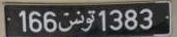

In [ ]:
# 57

img_bbox = df.loc[df['img_id']=='57.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/57.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

97 286 185 352
(547, 732, 3)


<ipython-input-92-e305fd0d2485>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


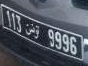

In [ ]:
# 58

img_bbox = df.loc[df['img_id']=='58.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/58.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

623 278 700 364
(477, 850, 3)


<ipython-input-93-36a014dfcc48>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


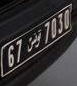

In [ ]:
# 59

img_bbox = df.loc[df['img_id']=='59.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/59.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

8 374 84 452
(547, 729, 3)


<ipython-input-95-3c775e4b5a48>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


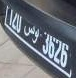

In [ ]:
# 60

img_bbox = df.loc[df['img_id']=='60.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/60.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

621 313 704 437
(547, 730, 3)


<ipython-input-106-d67def942ace>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


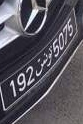

In [ ]:
# 61

img_bbox = df.loc[df['img_id']=='61.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/61.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

188 301 328 335
(547, 729, 3)


<ipython-input-107-1769589913df>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


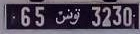

In [ ]:
# 62

img_bbox = df.loc[df['img_id']=='62.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/62.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

137 335 277 373
(547, 409, 3)


<ipython-input-108-b0481e0f9972>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


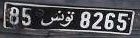

In [ ]:
# 63

img_bbox = df.loc[df['img_id']=='63.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/63.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 64

img_bbox = df.loc[df['img_id']=='64.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/64.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

320 287 443 318
(547, 729, 3)


<ipython-input-109-084c3c13f393>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


170 322 266 366
(476, 850, 3)


<ipython-input-110-a929f6a12df5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


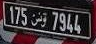

In [ ]:
# 65

img_bbox = df.loc[df['img_id']=='65.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/65.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

437 242 544 282
(477, 850, 3)


<ipython-input-111-d60eae62e6ff>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


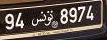

In [ ]:
# 66

img_bbox = df.loc[df['img_id']=='66.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/66.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

561 342 648 420
(547, 728, 3)


<ipython-input-112-30e3b3c03d08>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


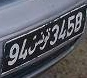

In [ ]:
# 67

img_bbox = df.loc[df['img_id']=='67.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/67.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

116 358 202 411
(535, 794, 3)


<ipython-input-113-0c93dd7fea67>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


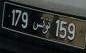

In [ ]:
# 68

img_bbox = df.loc[df['img_id']=='68.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/68.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

118 358 207 411
(535, 794, 3)


<ipython-input-114-251865c82191>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


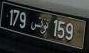

In [ ]:
# 69

img_bbox = df.loc[df['img_id']=='69.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/69.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

401 181 449 391
(547, 729, 3)


<ipython-input-115-6fa2209e66ee>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


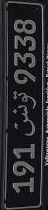

In [ ]:
# 70

img_bbox = df.loc[df['img_id']=='70.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/70.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 71

img_bbox = df.loc[df['img_id']=='71.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/71.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

195 255 288 272
(359, 479, 3)


<ipython-input-6-1730cfc40f72>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 72

img_bbox = df.loc[df['img_id']=='72.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/72.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

159 272 213 302
(477, 850, 3)


<ipython-input-7-a945d1add848>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 73

img_bbox = df.loc[df['img_id']=='73.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/73.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

417 173 443 250
(547, 729, 3)


<ipython-input-8-adcb0f287202>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 74

img_bbox = df.loc[df['img_id']=='74.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/74.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

286 250 393 281
(547, 729, 3)


<ipython-input-9-2be532f2bbe7>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 75

img_bbox = df.loc[df['img_id']=='75.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/75.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

156 377 273 407
(534, 410, 3)


<ipython-input-10-c52b628532a8>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


137 285 282 322
(547, 410, 3)


<ipython-input-11-8e4807a3d9e2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


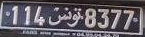

In [ ]:
# 76

img_bbox = df.loc[df['img_id']=='76.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/76.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

1 336 116 419
(547, 728, 3)


<ipython-input-12-711b3b794fb7>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


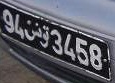

In [ ]:
# 77

img_bbox = df.loc[df['img_id']=='77.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/77.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 78

img_bbox = df.loc[df['img_id']=='78.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/78.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

417 248 446 370
(509, 850, 3)


<ipython-input-13-02ace7bd9786>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 79

img_bbox = df.loc[df['img_id']=='79.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/79.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

424 285 507 305
(547, 729, 3)


<ipython-input-16-7ef1c5907c73>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


304 405 490 448
(477, 850, 3)


<ipython-input-17-69eb0c6fe159>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


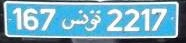

In [ ]:
# 80

img_bbox = df.loc[df['img_id']=='80.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/80.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 81

img_bbox = df.loc[df['img_id']=='81.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/81.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

171 307 283 333
(547, 410, 3)


<ipython-input-18-403326afc9f8>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


42 453 165 527
(547, 405, 3)


<ipython-input-19-5841454e5df5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


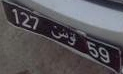

In [ ]:
# 82

img_bbox = df.loc[df['img_id']=='82.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/82.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

253 346 471 399
(547, 729, 3)


<ipython-input-20-19f894ef16fb>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


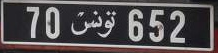

In [ ]:
# 83

img_bbox = df.loc[df['img_id']=='83.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/83.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

199 279 261 323
(510, 850, 3)


<ipython-input-21-67f47f18ef07>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


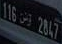

In [ ]:
# 84

img_bbox = df.loc[df['img_id']=='84.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/84.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

498 362 600 426
(547, 729, 3)


<ipython-input-22-6564d06e059a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


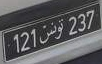

In [ ]:
# 85

img_bbox = df.loc[df['img_id']=='85.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/85.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

258 334 470 378
(547, 729, 3)


<ipython-input-23-c2a0c57130b9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


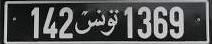

In [ ]:
# 86

img_bbox = df.loc[df['img_id']=='86.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/86.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

263 404 461 445
(547, 729, 3)


<ipython-input-24-12b2a1ea1849>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


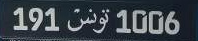

In [ ]:
# 87

img_bbox = df.loc[df['img_id']=='87.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/87.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 88

img_bbox = df.loc[df['img_id']=='88.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/88.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

329 439 517 467
(477, 850, 3)


<ipython-input-25-08a88b3a7858>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


144 261 343 301
(359, 479, 3)


<ipython-input-26-61cadf9874a0>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


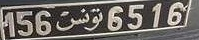

In [ ]:
# 89

img_bbox = df.loc[df['img_id']=='89.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/89.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 90

img_bbox = df.loc[df['img_id']=='90.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/90.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

129 337 211 361
(547, 307, 3)


<ipython-input-27-af52986009b2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


316 210 348 363
(547, 726, 3)


<ipython-input-28-f9386726c5ef>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


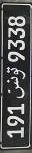

In [ ]:
# 91

img_bbox = df.loc[df['img_id']=='91.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/91.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

284 397 461 431
(547, 729, 3)


<ipython-input-29-5e62a41c3202>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


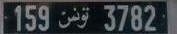

In [ ]:
# 92

img_bbox = df.loc[df['img_id']=='92.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/92.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

321 125 374 245
(547, 729, 3)


<ipython-input-30-f2b4d11cd4d5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


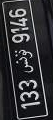

In [ ]:
# 93

img_bbox = df.loc[df['img_id']=='93.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/93.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

559 399 647 470
(547, 729, 3)


<ipython-input-31-a4194fc589e6>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


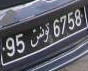

In [ ]:
# 94

img_bbox = df.loc[df['img_id']=='94.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/94.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

34 426 140 508
(547, 729, 3)


<ipython-input-32-d7cd2f82381a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


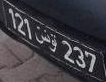

In [ ]:
# 95

img_bbox = df.loc[df['img_id']=='95.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/95.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

378 356 548 457
(547, 729, 3)


<ipython-input-34-2683d47db4f3>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


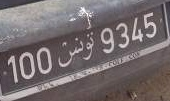

In [ ]:
# 96

img_bbox = df.loc[df['img_id']=='96.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/96.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

149 229 217 283
(455, 850, 3)


<ipython-input-39-94e4c9a7c61d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


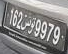

In [ ]:
# 97

img_bbox = df.loc[df['img_id']=='97.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/97.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 98

img_bbox = df.loc[df['img_id']=='98.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/98.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

252 272 383 300
(547, 663, 3)


<ipython-input-37-9e17810f75cf>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


503 53 569 217
(547, 729, 3)


<ipython-input-40-6431d3c62496>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


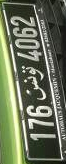

In [ ]:
# 99

img_bbox = df.loc[df['img_id']=='99.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/99.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

263 406 434 450
(547, 729, 3)


<ipython-input-41-3302dc5fd176>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


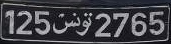

In [ ]:
# 100

img_bbox = df.loc[df['img_id']=='100.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/100.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

363 283 494 315
(477, 850, 3)


<ipython-input-42-06f6bce6508a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


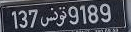

In [ ]:
# 101

img_bbox = df.loc[df['img_id']=='101.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/101.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

42 139 222 280
(547, 409, 3)


<ipython-input-44-b24167df2bc0>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


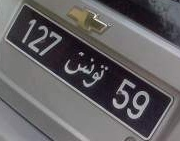

In [ ]:
# 102

img_bbox = df.loc[df['img_id']=='102.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/102.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

320 437 450 475
(547, 729, 3)


<ipython-input-49-bf5dbad0707a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


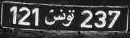

In [ ]:
# 103

img_bbox = df.loc[df['img_id']=='103.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/103.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

511 482 623 547
(547, 729, 3)


<ipython-input-50-999b4c928f5e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


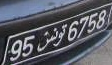

In [ ]:
# 104

img_bbox = df.loc[df['img_id']=='104.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/104.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

452 281 535 330
(476, 842, 3)


<ipython-input-51-81dd50b7d317>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


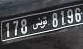

In [ ]:
# 105

img_bbox = df.loc[df['img_id']=='105.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/105.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 106

img_bbox = df.loc[df['img_id']=='106.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/106.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

172 309 281 332
(547, 410, 3)


<ipython-input-52-cf53d312409e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 107

img_bbox = df.loc[df['img_id']=='107.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/107.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

328 399 441 425
(547, 732, 3)


<ipython-input-53-4de300f81afb>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


611 98 681 379
(547, 729, 3)


<ipython-input-54-5c92c8acf047>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


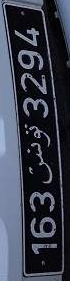

In [ ]:
# 108

img_bbox = df.loc[df['img_id']=='108.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/108.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 109

img_bbox = df.loc[df['img_id']=='109.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/109.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

137 236 222 255
(359, 479, 3)


<ipython-input-55-7bd64930f76d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


529 307 641 372
(510, 850, 3)


<ipython-input-56-369f80333d1e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


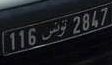

In [ ]:
# 110

img_bbox = df.loc[df['img_id']=='110.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/110.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

23 305 113 384
(477, 850, 3)


<ipython-input-57-9a52d8a876f2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


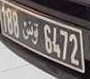

In [ ]:
# 111

img_bbox = df.loc[df['img_id']=='111.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/111.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

345 264 386 388
(547, 729, 3)


<ipython-input-58-5c8df69dbe34>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


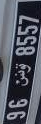

In [ ]:
# 112

img_bbox = df.loc[df['img_id']=='112.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/112.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

361 278 493 318
(477, 850, 3)


<ipython-input-59-16ec46413814>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


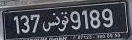

In [ ]:
# 113

img_bbox = df.loc[df['img_id']=='113.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/113.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

328 366 454 398
(477, 850, 3)


<ipython-input-60-1400231b2801>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


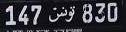

In [ ]:
# 114

img_bbox = df.loc[df['img_id']=='114.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/114.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

120 348 262 385
(547, 410, 3)


<ipython-input-61-020c559d1d08>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


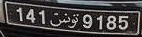

In [ ]:
# 115

img_bbox = df.loc[df['img_id']=='115.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/115.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

114 411 291 468
(547, 729, 3)


<ipython-input-62-79c10310dfae>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


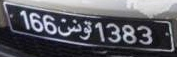

In [ ]:
# 116

img_bbox = df.loc[df['img_id']=='116.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/116.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

258 305 440 343
(547, 729, 3)


<ipython-input-63-b6b8cd3f66b4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


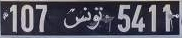

In [ ]:
# 117

img_bbox = df.loc[df['img_id']=='117.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/117.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

38 276 96 333
(546, 729, 3)


<ipython-input-64-c91a77cd951e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


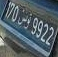

In [ ]:
# 118

img_bbox = df.loc[df['img_id']=='118.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/118.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

610 299 662 365
(547, 729, 3)


<ipython-input-65-a94259381b4f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


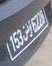

In [ ]:
# 119

img_bbox = df.loc[df['img_id']=='119.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/119.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

545 224 597 259
(479, 639, 3)


<ipython-input-66-58096a1a2583>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


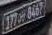

In [ ]:
# 120

img_bbox = df.loc[df['img_id']=='120.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/120.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 121

img_bbox = df.loc[df['img_id']=='121.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/121.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

333 403 499 432
(477, 850, 3)


<ipython-input-12-0631428d810f>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 122

img_bbox = df.loc[df['img_id']=='122.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/122.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

126 336 258 359
(547, 409, 3)


<ipython-input-13-4722aac44994>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 123

img_bbox = df.loc[df['img_id']=='123.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/123.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

120 287 193 302
(547, 307, 3)


<ipython-input-14-13895d36f6ca>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 124

img_bbox = df.loc[df['img_id']=='124.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/124.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

276 481 442 507
(547, 729, 3)


<ipython-input-15-5237ab500cf9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


191 314 338 386
(477, 725, 3)


<ipython-input-16-4fa4142705a4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


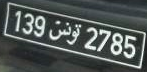

In [ ]:
# 125

img_bbox = df.loc[df['img_id']=='125.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/125.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 126

img_bbox = df.loc[df['img_id']=='126.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/126.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

138 372 250 392
(547, 410, 3)


<ipython-input-17-dcb2210df829>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


414 348 536 381
(547, 729, 3)


<ipython-input-18-ef803c8590d7>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


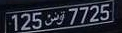

In [ ]:
# 127

img_bbox = df.loc[df['img_id']=='127.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/127.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

153 284 252 316
(547, 409, 3)


<ipython-input-19-fb71b8c2c6e4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


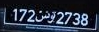

In [ ]:
# 128

img_bbox = df.loc[df['img_id']=='128.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/128.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 129

img_bbox = df.loc[df['img_id']=='129.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/129.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

130 324 253 352
(547, 409, 3)


<ipython-input-20-076bbf2e1fed>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


99 367 212 448
(547, 730, 3)


<ipython-input-21-dbb121359d8d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


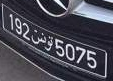

In [ ]:
# 130

img_bbox = df.loc[df['img_id']=='130.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/130.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

119 392 285 439
(547, 409, 3)


<ipython-input-22-d21d6e60a74d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


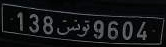

In [ ]:
# 131

img_bbox = df.loc[df['img_id']=='131.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/131.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

517 318 641 397
(477, 850, 3)


<ipython-input-26-c367918365a6>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


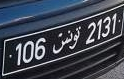

In [ ]:
# 132

img_bbox = df.loc[df['img_id']=='132.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/132.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 133

img_bbox = df.loc[df['img_id']=='133.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/133.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

135 413 259 440
(535, 410, 3)


<ipython-input-27-30861bd676ba>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


366 146 415 341
(477, 850, 3)


<ipython-input-28-dba84238deb4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


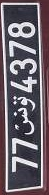

In [ ]:
# 134

img_bbox = df.loc[df['img_id']=='134.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/134.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 135

img_bbox = df.loc[df['img_id']=='135.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/135.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

171 361 265 383
(547, 410, 3)


<ipython-input-29-0a119afdded3>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


152 213 292 246
(547, 410, 3)


<ipython-input-31-a0cc2c6abf0e>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


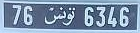

In [ ]:
# 136

img_bbox = df.loc[df['img_id']=='136.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/136.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

429 252 549 362
(547, 729, 3)


<ipython-input-32-013037d61f64>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


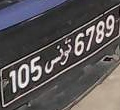

In [ ]:
# 137

img_bbox = df.loc[df['img_id']=='137.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/137.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 138

img_bbox = df.loc[df['img_id']=='138.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/138.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

130 278 194 294
(547, 307, 3)


<ipython-input-33-e107bb72d738>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


61 309 143 356
(547, 410, 3)


<ipython-input-34-8b8f3e28577d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


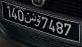

In [ ]:
# 139

img_bbox = df.loc[df['img_id']=='139.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/139.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

309 339 517 393
(477, 850, 3)


<ipython-input-35-a0728eebd237>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


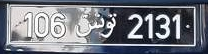

In [ ]:
# 140

img_bbox = df.loc[df['img_id']=='140.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/140.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

201 307 325 379
(477, 830, 3)


<ipython-input-36-9c2b394012fd>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


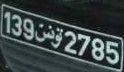

In [ ]:
# 141

img_bbox = df.loc[df['img_id']=='141.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/141.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

625 283 661 347
(530, 729, 3)


<ipython-input-37-877620f1e90d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


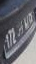

In [ ]:
# 142

img_bbox = df.loc[df['img_id']=='142.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/142.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

419 280 492 320
(547, 729, 3)


<ipython-input-38-b5edae8e9034>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


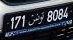

In [ ]:
# 143

img_bbox = df.loc[df['img_id']=='143.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/143.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 145

img_bbox = df.loc[df['img_id']=='145.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/145.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

176 235 302 266
(359, 479, 3)


<ipython-input-39-840637203c9c>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


515 261 583 336
(547, 729, 3)


<ipython-input-40-d43e9eda27dd>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


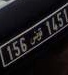

In [ ]:
# 146

img_bbox = df.loc[df['img_id']=='146.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/146.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

248 352 460 413
(547, 821, 3)


<ipython-input-41-170168ed33f4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


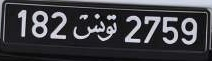

In [ ]:
# 147

img_bbox = df.loc[df['img_id']=='147.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/147.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

145 184 241 241
(457, 850, 3)


<ipython-input-42-97b5aa9e2c25>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


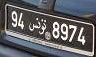

In [ ]:
# 148

img_bbox = df.loc[df['img_id']=='148.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/148.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 149

img_bbox = df.loc[df['img_id']=='149.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/149.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

156 328 250 351
(547, 410, 3)


<ipython-input-43-d4cd5db3c459>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 150

img_bbox = df.loc[df['img_id']=='150.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/150.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

165 318 272 344
(547, 409, 3)


<ipython-input-44-2eb85ea65254>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


316 429 554 472
(509, 850, 3)


<ipython-input-45-7940d8327f40>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


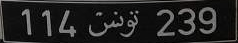

In [ ]:
# 151

img_bbox = df.loc[df['img_id']=='151.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/151.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

153 384 285 444
(547, 729, 3)


<ipython-input-46-574f5ce3abb8>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


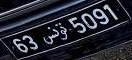

In [ ]:
# 152

img_bbox = df.loc[df['img_id']=='152.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/152.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

139 297 286 330
(547, 410, 3)


<ipython-input-47-0947ef14a742>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


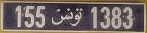

In [ ]:
# 153

img_bbox = df.loc[df['img_id']=='153.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/153.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

187 328 310 367
(547, 410, 3)


<ipython-input-49-d150a0c86108>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


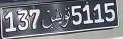

In [ ]:
# 154

img_bbox = df.loc[df['img_id']=='154.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/154.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 155

img_bbox = df.loc[df['img_id']=='155.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/155.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

186 196 271 213
(359, 479, 3)


<ipython-input-50-c006e5e22bf4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


149 284 276 341
(477, 850, 3)


<ipython-input-51-403cb34e0ba1>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


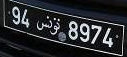

In [ ]:
# 156

img_bbox = df.loc[df['img_id']=='156.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/156.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

268 369 384 419
(477, 850, 3)


<ipython-input-52-7a39d41a4b74>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


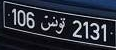

In [ ]:
# 157

img_bbox = df.loc[df['img_id']=='157.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/157.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

513 118 558 253
(509, 850, 3)


<ipython-input-53-b81eefcfd066>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


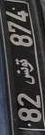

In [ ]:
# 158

img_bbox = df.loc[df['img_id']=='158.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/158.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

62 310 142 351
(547, 410, 3)


<ipython-input-54-a89cc4e36bd6>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


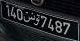

In [ ]:
# 159

img_bbox = df.loc[df['img_id']=='159.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/159.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

276 402 530 457
(509, 850, 3)


<ipython-input-55-bd4b19244552>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


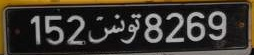

In [ ]:
# 160

img_bbox = df.loc[df['img_id']=='160.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/160.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 161

img_bbox = df.loc[df['img_id']=='161.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/161.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

111 186 207 204
(525, 307, 3)


<ipython-input-56-540d3cb1a026>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


412 379 556 470
(547, 729, 3)


<ipython-input-57-4112d576da08>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


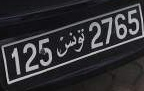

In [ ]:
# 162

img_bbox = df.loc[df['img_id']=='162.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/162.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

440 154 473 298
(476, 850, 3)


<ipython-input-58-dc007750034a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


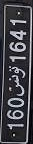

In [ ]:
# 163

img_bbox = df.loc[df['img_id']=='163.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/163.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

146 333 272 369
(547, 410, 3)


<ipython-input-59-cc043ff4c829>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


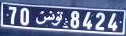

In [ ]:
# 164

img_bbox = df.loc[df['img_id']=='164.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/164.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

268 331 448 372
(539, 719, 3)


<ipython-input-60-b36e05a65d19>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


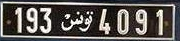

In [ ]:
# 165

img_bbox = df.loc[df['img_id']=='165.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/165.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 166

img_bbox = df.loc[df['img_id']=='166.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/166.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

133 480 271 510
(547, 410, 3)


<ipython-input-61-fd8990175c91>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


440 269 538 320
(477, 850, 3)


<ipython-input-62-de9b9dad0493>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


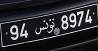

In [ ]:
# 167

img_bbox = df.loc[df['img_id']=='167.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/167.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

506 80 612 344
(547, 729, 3)


<ipython-input-63-6c5174ad10d2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


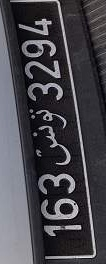

In [ ]:
# 168

img_bbox = df.loc[df['img_id']=='168.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/168.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

498 134 619 227
(547, 729, 3)


<ipython-input-64-1280560253a9>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


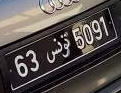

In [ ]:
# 169

img_bbox = df.loc[df['img_id']=='169.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/169.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 170

img_bbox = df.loc[df['img_id']=='170.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/170.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

396 262 530 290
(509, 838, 3)


<ipython-input-65-9e37f4e37af5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


123 301 233 353
(470, 850, 3)


<ipython-input-66-d593bd79181c>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


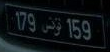

In [ ]:
# 171

img_bbox = df.loc[df['img_id']=='171.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/171.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

331 391 490 453
(477, 850, 3)


<ipython-input-67-a6d71db76b69>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


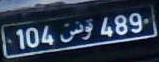

In [ ]:
# 172

img_bbox = df.loc[df['img_id']=='172.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/172.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

45 386 168 428
(547, 410, 3)


<ipython-input-68-626e8802100a>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


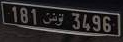

In [ ]:
# 173

img_bbox = df.loc[df['img_id']=='173.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/173.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 174

img_bbox = df.loc[df['img_id']=='174.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/174.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

103 257 192 282
(547, 307, 3)


<ipython-input-69-9144d21a5a52>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


311 364 562 417
(477, 850, 3)


<ipython-input-70-7549b1cf6ece>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


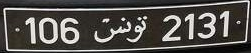

In [ ]:
# 175

img_bbox = df.loc[df['img_id']=='175.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/175.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

658 301 762 359
(491, 821, 3)


<ipython-input-71-845613eb5c78>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


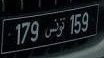

In [ ]:
# 176

img_bbox = df.loc[df['img_id']=='176.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/176.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 177

img_bbox = df.loc[df['img_id']=='177.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/177.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

139 385 258 406
(547, 410, 3)


<ipython-input-72-ada39c01aaf1>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


311 365 561 420
(477, 850, 3)


<ipython-input-73-34397679d936>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


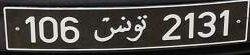

In [ ]:
# 178

img_bbox = df.loc[df['img_id']=='178.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/178.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

66 281 145 317
(547, 410, 3)


<ipython-input-74-3903b19d5e72>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


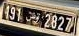

In [ ]:
# 179

img_bbox = df.loc[df['img_id']=='179.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/179.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

552 266 646 319
(477, 850, 3)


<ipython-input-75-f4cb87a5fe4d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


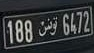

In [ ]:
# 180

img_bbox = df.loc[df['img_id']=='180.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/180.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 181

img_bbox = df.loc[df['img_id']=='181.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/181.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

118 217 208 241
(508, 409, 3)


<ipython-input-76-cacbed61ace2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 182

img_bbox = df.loc[df['img_id']=='182.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/182.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

103 293 221 321
(479, 287, 3)


<ipython-input-77-8f8a2fa178ae>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


478 120 515 296
(477, 850, 3)


<ipython-input-78-66654345c8a5>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


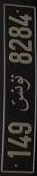

In [ ]:
# 183

img_bbox = df.loc[df['img_id']=='183.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/183.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

207 392 344 424
(547, 729, 3)


<ipython-input-79-13441d64ee2d>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


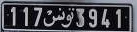

In [ ]:
# 186

img_bbox = df.loc[df['img_id']=='186.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/186.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 187

img_bbox = df.loc[df['img_id']=='187.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/187.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

377 329 406 438
(547, 729, 3)


<ipython-input-81-bafae168dcbc>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


223 264 435 312
(547, 666, 3)


<ipython-input-83-86a4f0b430dd>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


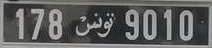

In [ ]:
# 188

img_bbox = df.loc[df['img_id']=='188.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/188.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

192 227 277 266
(547, 409, 3)


<ipython-input-84-f2acd3a1d431>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


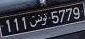

In [ ]:
# 189

img_bbox = df.loc[df['img_id']=='189.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/189.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

50 266 221 315
(407, 305, 3)


<ipython-input-85-dffd906ffbcc>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


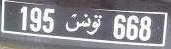

In [ ]:
# 190

img_bbox = df.loc[df['img_id']=='190.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/190.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 191

img_bbox = df.loc[df['img_id']=='191.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/191.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

334 295 471 326
(476, 850, 3)


<ipython-input-86-bc0e76b6e9dc>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


302 396 453 432
(547, 729, 3)


<ipython-input-88-008e98ff7454>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


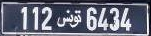

In [ ]:
# 192

img_bbox = df.loc[df['img_id']=='192.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/192.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

593 357 694 419
(477, 850, 3)


<ipython-input-89-78382464a0cf>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


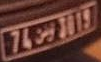

In [ ]:
# 193

img_bbox = df.loc[df['img_id']=='193.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/193.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

110 416 257 473
(547, 733, 3)


<ipython-input-90-1f34f34274a2>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


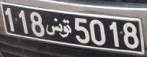

In [ ]:
# 194

img_bbox = df.loc[df['img_id']=='194.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/194.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

290 370 446 420
(547, 728, 3)


<ipython-input-91-5d8573573743>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


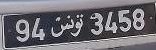

In [ ]:
# 195

img_bbox = df.loc[df['img_id']=='195.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/195.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

In [ ]:
# 196

img_bbox = df.loc[df['img_id']=='196.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/196.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

181 263 269 280
(502, 409, 3)


<ipython-input-92-60631d1f6068>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 197

img_bbox = df.loc[df['img_id']=='197.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/197.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

100 302 206 329
(547, 307, 3)


<ipython-input-93-2db982146ce4>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 198

img_bbox = df.loc[df['img_id']=='198.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/198.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

146 294 216 316
(547, 410, 3)


<ipython-input-94-68a3edc50110>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


In [ ]:
# 199

img_bbox = df.loc[df['img_id']=='199.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/199.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

145 191 279 220
(359, 479, 3)


<ipython-input-95-7b3b09bfeb48>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


200 437 386 475
(547, 515, 3)


<ipython-input-96-ee4c54228550>:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])


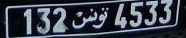

In [ ]:
# 200

img_bbox = df.loc[df['img_id']=='200.jpg']
x_min, y_min, x_max, y_max = int(img_bbox["xmin"]), int(img_bbox["ymin"]), int(img_bbox["xmax"]), int(img_bbox["ymax"])
print(x_min, y_min, x_max, y_max)
# plot the box and visualize
img = cv2.imread("/content/200.jpg")
print(img.shape) # -> (h, w , 3) ->(BGR)
# crop the region
plate = img[y_min:y_max,  x_min:x_max]
cv2_imshow(plate)

**A COLLECTION OF VEICLE IMAGES(Bounding Boxes Encapsulating The License Plates At a Time All Images)**

Processing 1.jpg: (94, 276, 169, 326)
Image shape: (477, 850, 3)


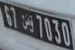

Processing 10.jpg: (395, 311, 444, 344)
Image shape: (479, 639, 3)


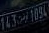

Processing 100.jpg: (263, 406, 434, 450)
Processing 101.jpg: (363, 283, 494, 315)
Processing 102.jpg: (42, 139, 222, 280)
Processing 103.jpg: (320, 437, 450, 475)
Processing 104.jpg: (511, 482, 623, 547)
Processing 105.jpg: (452, 281, 535, 330)
Processing 106.jpg: (172, 309, 281, 332)
Processing 107.jpg: (328, 399, 441, 425)
Processing 108.jpg: (611, 98, 681, 379)
Processing 109.jpg: (137, 236, 222, 255)
Processing 11.jpg: (359, 378, 545, 421)
Image shape: (547, 821, 3)


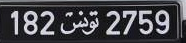

Processing 110.jpg: (529, 307, 641, 372)
Processing 111.jpg: (23, 305, 113, 384)
Processing 112.jpg: (345, 264, 386, 388)
Processing 113.jpg: (361, 278, 493, 318)
Processing 114.jpg: (328, 366, 454, 398)
Processing 115.jpg: (120, 348, 262, 385)
Processing 116.jpg: (114, 411, 291, 468)
Processing 117.jpg: (258, 305, 440, 343)
Processing 118.jpg: (38, 276, 96, 333)
Processing 119.jpg: (610, 299, 662, 365)
Processing 12.jpg: (243, 402, 385, 450)
Image shape: (477, 850, 3)


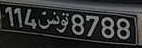

Processing 120.jpg: (545, 224, 597, 259)
Processing 121.jpg: (333, 403, 499, 432)
Processing 122.jpg: (126, 336, 258, 359)
Processing 123.jpg: (120, 287, 193, 302)
Processing 124.jpg: (276, 481, 442, 507)
Processing 125.jpg: (191, 314, 338, 386)
Processing 126.jpg: (138, 372, 250, 392)
Processing 127.jpg: (414, 348, 536, 381)
Processing 128.jpg: (153, 284, 252, 316)
Processing 129.jpg: (130, 324, 253, 352)
Processing 13.jpg: (285, 347, 562, 397)
Image shape: (477, 850, 3)


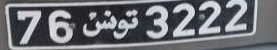

Processing 130.jpg: (99, 367, 212, 448)
Processing 131.jpg: (119, 392, 285, 439)
Processing 132.jpg: (517, 318, 641, 397)
Processing 133.jpg: (135, 413, 259, 440)
Processing 134.jpg: (366, 146, 415, 341)
Processing 135.jpg: (171, 361, 265, 383)
Processing 136.jpg: (152, 213, 292, 246)
Processing 137.jpg: (429, 252, 549, 362)
Processing 138.jpg: (130, 278, 194, 294)
Processing 139.jpg: (61, 309, 143, 356)
Processing 14.jpg: (289, 376, 501, 417)
Image shape: (477, 850, 3)


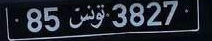

Processing 140.jpg: (309, 339, 517, 393)
Processing 141.jpg: (201, 307, 325, 379)
Processing 142.jpg: (625, 283, 661, 347)
Processing 143.jpg: (419, 280, 492, 320)
Processing 144.jpg: (159, 286, 245, 303)
Processing 145.jpg: (176, 235, 302, 266)
Processing 146.jpg: (515, 261, 583, 336)
Processing 147.jpg: (248, 352, 460, 413)
Processing 148.jpg: (145, 184, 241, 241)
Processing 149.jpg: (156, 328, 250, 351)
Processing 15.jpg: (69, 379, 190, 405)
Image shape: (547, 410, 3)


Processing 150.jpg: (165, 318, 272, 344)
Processing 151.jpg: (316, 429, 554, 472)
Processing 152.jpg: (153, 384, 285, 444)
Processing 153.jpg: (139, 297, 286, 330)
Processing 154.jpg: (187, 328, 310, 367)
Processing 155.jpg: (186, 196, 271, 213)
Processing 156.jpg: (149, 284, 276, 341)
Processing 157.jpg: (268, 369, 384, 419)
Processing 158.jpg: (513, 118, 558, 253)
Processing 159.jpg: (62, 310, 142, 351)
Processing 16.jpg: (255, 314, 428, 359)
Image shape: (547, 729, 3)


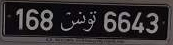

Processing 160.jpg: (276, 402, 530, 457)
Processing 161.jpg: (111, 186, 207, 204)
Processing 162.jpg: (412, 379, 556, 470)
Processing 163.jpg: (440, 154, 473, 298)
Processing 164.jpg: (146, 333, 272, 369)
Processing 165.jpg: (268, 331, 448, 372)
Processing 166.jpg: (133, 480, 271, 510)
Processing 167.jpg: (440, 269, 538, 320)
Processing 168.jpg: (506, 80, 612, 344)
Processing 169.jpg: (498, 134, 619, 227)
Processing 17.jpg: (200, 397, 380, 498)
Image shape: (509, 850, 3)


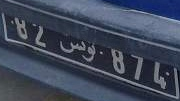

Processing 170.jpg: (396, 262, 530, 290)
Processing 171.jpg: (123, 301, 233, 353)
Processing 172.jpg: (331, 391, 490, 453)
Processing 173.jpg: (45, 386, 168, 428)
Processing 174.jpg: (103, 257, 192, 282)
Processing 175.jpg: (311, 364, 562, 417)
Processing 176.jpg: (658, 301, 762, 359)
Processing 177.jpg: (139, 385, 258, 406)
Processing 178.jpg: (311, 365, 561, 420)
Processing 179.jpg: (66, 281, 145, 317)
Processing 18.jpg: (354, 176, 395, 348)
Image shape: (547, 729, 3)


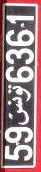

Processing 180.jpg: (552, 266, 646, 319)
Processing 181.jpg: (118, 217, 208, 241)
Processing 182.jpg: (103, 293, 221, 321)
Processing 183.jpg: (478, 120, 515, 296)
Processing 184.jpg: (120, 239, 216, 263)
Processing 185.jpg: (230, 378, 438, 423)
Processing 186.jpg: (207, 392, 344, 424)
Processing 187.jpg: (377, 329, 406, 438)
Processing 188.jpg: (223, 264, 435, 312)
Processing 189.jpg: (192, 227, 277, 266)
Processing 19.jpg: (96, 263, 206, 301)
Image shape: (547, 307, 3)


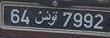

Processing 190.jpg: (50, 266, 221, 315)
Processing 191.jpg: (334, 295, 471, 326)
Processing 192.jpg: (302, 396, 453, 432)
Processing 193.jpg: (593, 357, 694, 419)
Processing 194.jpg: (110, 416, 257, 473)
Processing 195.jpg: (290, 370, 446, 420)
Processing 196.jpg: (181, 263, 269, 280)
Processing 197.jpg: (100, 302, 206, 329)
Processing 198.jpg: (146, 294, 216, 316)
Processing 199.jpg: (145, 191, 279, 220)
Processing 2.jpg: (96, 297, 209, 324)
Image shape: (547, 307, 3)


Processing 20.jpg: (153, 232, 192, 270)
Image shape: (404, 719, 3)


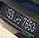

Processing 200.jpg: (200, 437, 386, 475)
Processing 201.jpg: (257, 368, 461, 409)
Processing 202.jpg: (179, 239, 212, 274)
Processing 203.jpg: (175, 327, 263, 385)
Processing 204.jpg: (150, 345, 291, 374)
Processing 205.jpg: (495, 379, 595, 431)
Processing 206.jpg: (96, 355, 207, 389)
Processing 207.jpg: (501, 174, 537, 316)
Processing 208.jpg: (562, 154, 615, 321)
Processing 209.jpg: (47, 360, 109, 409)
Processing 21.jpg: (300, 432, 494, 473)
Processing 210.jpg: (297, 304, 484, 349)
Processing 211.jpg: (97, 265, 207, 291)
Processing 212.jpg: (89, 240, 202, 269)
Processing 213.jpg: (312, 339, 507, 388)
Processing 214.jpg: (521, 319, 645, 400)
Processing 215.jpg: (99, 319, 202, 341)
Processing 216.jpg: (107, 397, 247, 455)
Processing 217.jpg: (107, 260, 155, 292)
Processing 218.jpg: (151, 281, 276, 342)
Processing 219.jpg: (269, 407, 506, 456)
Processing 22.jpg: (162, 236, 262, 256)
Processing 220.jpg: (110, 343, 274, 413)
Processing 221.jpg: (248, 322, 442, 368)
Processing 222.jpg: (19

Processing 30.jpg: (276, 237, 404, 265)
Processing 300.jpg: (254, 311, 333, 353)
Processing 301.jpg: (133, 402, 281, 433)
Processing 302.jpg: (145, 409, 278, 443)
Processing 303.jpg: (148, 288, 324, 336)
Processing 304.jpg: (119, 336, 210, 359)
Processing 305.jpg: (105, 307, 197, 334)
Processing 306.jpg: (140, 293, 241, 317)
Processing 307.jpg: (150, 330, 270, 357)
Processing 308.jpg: (627, 160, 690, 392)
Processing 309.jpg: (328, 376, 489, 414)
Processing 31.jpg: (129, 337, 240, 357)
Processing 310.jpg: (219, 224, 305, 257)
Processing 311.jpg: (138, 347, 220, 379)
Processing 312.jpg: (348, 290, 469, 324)
Processing 313.jpg: (293, 367, 433, 400)
Processing 314.jpg: (63, 395, 171, 472)
Processing 315.jpg: (332, 309, 507, 351)
Processing 316.jpg: (123, 290, 217, 312)
Processing 317.jpg: (89, 373, 263, 443)
Processing 318.jpg: (311, 341, 509, 385)
Processing 319.jpg: (71, 356, 196, 387)
Processing 32.jpg: (292, 324, 409, 437)
Processing 320.jpg: (576, 111, 640, 307)
Processing 321.jpg: (3

Processing 40.jpg: (163, 288, 240, 302)
Processing 400.jpg: (191, 331, 281, 364)
Processing 401.jpg: (255, 319, 365, 357)
Processing 402.jpg: (454, 191, 486, 327)
Processing 403.jpg: (340, 131, 387, 268)
Processing 404.jpg: (126, 177, 242, 212)
Processing 405.jpg: (156, 379, 249, 424)
Processing 406.jpg: (135, 377, 267, 410)
Processing 407.jpg: (134, 233, 224, 272)
Processing 408.jpg: (306, 397, 460, 433)
Processing 409.jpg: (380, 248, 536, 313)
Processing 41.jpg: (383, 387, 420, 487)
Processing 410.jpg: (236, 89, 302, 231)
Processing 411.jpg: (354, 197, 479, 224)
Processing 412.jpg: (608, 183, 645, 386)
Processing 413.jpg: (301, 346, 448, 387)
Processing 414.jpg: (133, 286, 251, 359)
Processing 415.jpg: (127, 323, 259, 357)
Processing 416.jpg: (149, 162, 287, 196)
Processing 417.jpg: (284, 336, 517, 399)
Processing 418.jpg: (174, 219, 251, 239)
Processing 419.jpg: (212, 366, 333, 403)
Processing 42.jpg: (577, 118, 609, 203)
Processing 420.jpg: (240, 374, 406, 412)
Processing 421.jpg: 

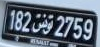

Processing 50.jpg: (164, 405, 291, 451)
Processing 500.jpg: (143, 275, 273, 306)
Processing 501.jpg: (543, 239, 664, 342)
Processing 502.jpg: (249, 371, 410, 409)
Processing 503.jpg: (217, 333, 317, 369)
Processing 504.jpg: (159, 339, 274, 368)
Processing 505.jpg: (288, 420, 407, 450)
Processing 506.jpg: (203, 234, 508, 304)
Processing 507.jpg: (131, 301, 274, 336)
Processing 508.jpg: (50, 264, 219, 314)
Processing 509.jpg: (103, 323, 263, 358)
Processing 51.jpg: (425, 339, 505, 362)
Processing 510.jpg: (429, 229, 588, 282)
Processing 511.jpg: (257, 379, 446, 429)
Processing 512.jpg: (109, 308, 211, 331)
Processing 513.jpg: (130, 306, 233, 331)
Processing 514.jpg: (244, 396, 404, 446)
Processing 515.jpg: (122, 387, 282, 418)
Processing 516.jpg: (258, 337, 336, 367)
Processing 517.jpg: (142, 400, 220, 433)
Processing 518.jpg: (84, 432, 269, 466)
Processing 519.jpg: (343, 307, 496, 350)
Processing 52.jpg: (161, 170, 279, 198)
Processing 520.jpg: (277, 427, 517, 484)
Processing 521.jpg: (

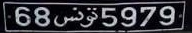

Processing 60.jpg: (8, 374, 84, 452)
Processing 600.jpg: (126, 247, 297, 275)
Processing 601.jpg: (283, 289, 391, 323)
Processing 602.jpg: (237, 355, 381, 411)
Processing 603.jpg: (112, 289, 263, 324)
Processing 604.jpg: (365, 419, 477, 443)
Processing 605.jpg: (105, 324, 265, 355)
Processing 606.jpg: (608, 265, 711, 344)
Processing 607.jpg: (281, 364, 438, 405)
Processing 608.jpg: (239, 346, 504, 404)
Processing 609.jpg: (313, 333, 516, 376)
Processing 61.jpg: (621, 313, 704, 437)
Processing 610.jpg: (154, 237, 248, 267)
Processing 611.jpg: (34, 146, 262, 189)
Processing 612.jpg: (319, 290, 575, 354)
Processing 613.jpg: (324, 313, 500, 353)
Processing 614.jpg: (189, 347, 303, 391)
Processing 615.jpg: (60, 329, 204, 366)
Processing 616.jpg: (210, 372, 369, 422)
Processing 617.jpg: (100, 318, 198, 340)
Processing 618.jpg: (99, 330, 217, 358)
Processing 619.jpg: (177, 291, 293, 338)
Processing 62.jpg: (188, 301, 328, 335)
Processing 620.jpg: (242, 263, 366, 298)
Processing 621.jpg: (56, 

Processing 70.jpg: (401, 181, 449, 391)
Processing 700.jpg: (128, 345, 290, 380)
Processing 701.jpg: (112, 313, 220, 344)
Processing 702.jpg: (108, 192, 170, 211)
Processing 703.jpg: (345, 331, 523, 376)
Processing 704.jpg: (397, 333, 539, 370)
Processing 705.jpg: (130, 313, 202, 336)
Processing 706.jpg: (281, 338, 388, 374)
Processing 707.jpg: (478, 160, 515, 314)
Processing 708.jpg: (418, 442, 571, 496)
Processing 709.jpg: (103, 172, 192, 196)
Processing 71.jpg: (195, 255, 288, 272)
Processing 710.jpg: (108, 315, 209, 344)
Processing 711.jpg: (252, 406, 473, 458)
Processing 712.jpg: (260, 326, 448, 372)
Processing 713.jpg: (134, 339, 272, 363)
Processing 714.jpg: (367, 430, 600, 481)
Processing 715.jpg: (114, 322, 206, 346)
Processing 716.jpg: (107, 217, 208, 250)
Processing 717.jpg: (169, 214, 276, 270)
Processing 718.jpg: (140, 362, 289, 406)
Processing 719.jpg: (308, 332, 458, 368)
Processing 72.jpg: (159, 272, 213, 302)
Processing 720.jpg: (171, 308, 419, 377)
Processing 721.jpg:

Processing 80.jpg: (304, 405, 490, 448)
Processing 800.jpg: (397, 330, 577, 389)
Processing 801.jpg: (277, 298, 549, 364)
Processing 802.jpg: (123, 328, 289, 371)
Processing 803.jpg: (293, 293, 455, 333)
Processing 804.jpg: (346, 203, 525, 245)
Processing 805.jpg: (138, 418, 304, 461)
Processing 806.jpg: (105, 339, 202, 370)
Processing 807.jpg: (116, 191, 217, 221)
Processing 808.jpg: (349, 343, 456, 370)
Processing 809.jpg: (136, 305, 239, 336)
Processing 81.jpg: (171, 307, 283, 333)
Processing 810.jpg: (651, 391, 730, 456)
Processing 811.jpg: (58, 301, 134, 324)
Processing 812.jpg: (484, 288, 645, 321)
Processing 813.jpg: (53, 263, 136, 318)
Processing 814.jpg: (279, 337, 388, 375)
Processing 815.jpg: (393, 357, 540, 394)
Processing 816.jpg: (406, 420, 546, 492)
Processing 817.jpg: (130, 309, 233, 336)
Processing 818.jpg: (306, 346, 425, 383)
Processing 819.jpg: (360, 294, 494, 343)
Processing 82.jpg: (42, 453, 165, 527)
Processing 820.jpg: (133, 263, 254, 294)
Processing 821.jpg: (1

Processing 90.jpg: (129, 337, 211, 361)
Processing 900.jpg: (266, 286, 421, 332)
Processing 91.jpg: (316, 210, 348, 363)
Processing 92.jpg: (284, 397, 461, 431)
Processing 93.jpg: (321, 125, 374, 245)
Processing 94.jpg: (559, 399, 647, 470)
Processing 95.jpg: (34, 426, 140, 508)
Processing 96.jpg: (378, 356, 548, 457)
Processing 97.jpg: (149, 229, 217, 283)
Processing 98.jpg: (252, 272, 383, 300)
Processing 99.jpg: (503, 53, 569, 217)


In [ ]:
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow

# Read annotation file
df = pd.read_csv("/content/Licplatesdetection_train.csv")

# Iterate over each row in the dataframe
for index, row in df.iterrows():
  img_id = row['img_id']
  x_min, y_min, x_max, y_max = int(row["xmin"]), int(row["ymin"]), int(row["xmax"]), int(row["ymax"])

  # Print the bounding box coordinates for the current image
  print(f'Processing {img_id}: ({x_min}, {y_min}, {x_max}, {y_max})')

  # Read the image
  img = cv2.imread(f'/content/{img_id}')
  if img is not None:
    print(f'Image shape: {img.shape}')  # Print image shape

    # Crop the region of interest
    plate = img[y_min:y_max, x_min:x_max]

    # Display the cropped region
    cv2_imshow(plate)
    cv2.waitKey(0)

cv2.destroyAllWindows()
   # else:
        #print(f'Failed to load image: {img_id}')


**An assemblage of license plate images**

In [ ]:
import os
import cv2

new_size = 224
img_top_path = "/content/200.jpg"  # Update the path to the directory containing images or specify the path to a single image file
preprocessed_imgs = "output"

# Check if the specified path is a directory or a file
if os.path.isdir(img_top_path):
    # Iterate over images in the directory
    for img_name in os.listdir(img_top_path):
        img_path = os.path.join(img_top_path, img_name)

        # Load the image
        img = cv2.imread(img_path)

        # Check if the image loading is successful
        if img is not None:
            # Resize the image
            img_resized = cv2.resize(img, (new_size, new_size))

            # Save the resized image
            cv2.imwrite(f"{preprocessed_imgs}/{img_name}", img_resized)
        else:
            print(f"Failed to load image: {img_path}")
else:
    # Load the single image file
    img_path = img_top_path

    # Load the image
    img = cv2.imread(img_path)

    # Check if the image loading is successful
    if img is not None:
        # Resize the image
        img_resized = cv2.resize(img, (new_size, new_size))

        # Save the resized image
        img_name = os.path.basename(img_path)
        cv2.imwrite(f"{preprocessed_imgs}/{img_name}", img_resized)
    else:
        print(f"Failed to load image: {img_path}")


In [ ]:
pip install torchvision


In [ ]:
pip install torch


In [ ]:
# Read the image and convert to grayscale
image = cv2.imread("/content/200.jpg")
print(image.shape)
# plate = image[y_min:y_max,  x_min:x_max]
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(gray,150,255,cv2.THRESH_BINARY)

# blurred = cv2.GaussianBlur(gray, (5, 5), 0)
# thresh = cv2.adaptiveThreshold(blurred,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
#  cv2.THRESH_BINARY,11,2)


(547, 515, 3)


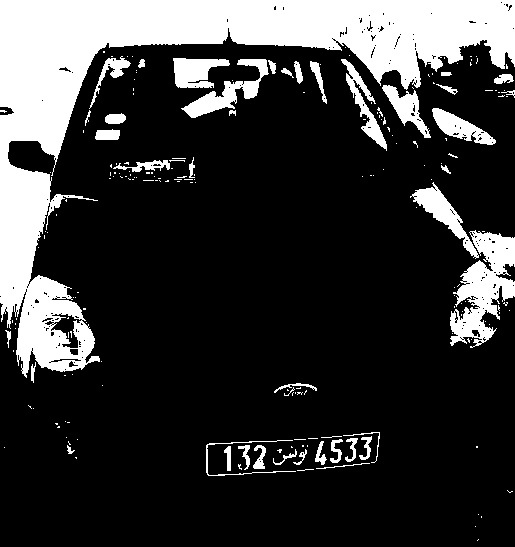

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(thresh)

281705


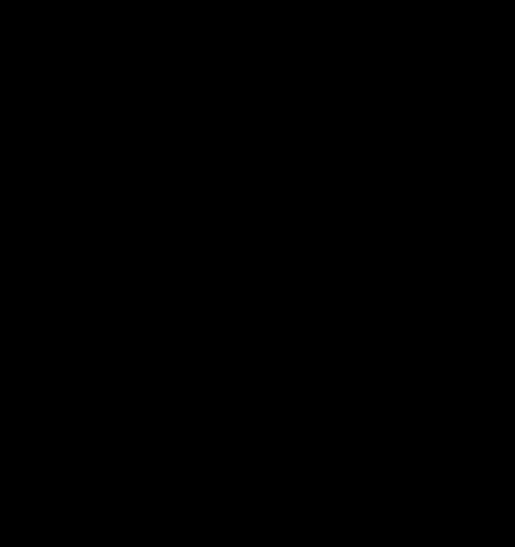

In [ ]:
import numpy as np

_, labels = cv2.connectedComponents(thresh)
mask = np.zeros(thresh.shape, dtype="uint8")

# Set lower bound and upper bound criteria for characters
total_pixels = thresh.shape[0] * thresh.shape[1]
print(total_pixels)
# lower = total_pixels // 100 # heuristic param, can be fine tuned if necessary
# upper = total_pixels //35 # heuristic param, can be fine tuned if necessary
lower = total_pixels // 3 # heuristic param, can be fine tuned if necessary
upper = total_pixels // 3 # heuristic param, can be fine tuned if necessary

# Loop over the unique components
for (i, label) in enumerate(np.unique(labels)):
    # If this is the background label, ignore it
    if label == 0:
        continue

    # Otherwise, construct the label mask to display only connected component
    # for the current label
    labelMask = np.zeros(thresh.shape, dtype="uint8")
    labelMask[labels == label] = 255
    numPixels = cv2.countNonZero(labelMask)
    # print(numPixels)

    # If the number of pixels in the component is between lower bound and upper bound,
    # add it to our mask
    if numPixels > lower and numPixels < upper:
        mask = cv2.add(mask, labelMask)

cv2_imshow(mask)


In [ ]:
# Find contours and get bounding box for each contour
import functools
import numpy as np
cnts, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
boundingBoxes = [cv2.boundingRect(c) for c in cnts]

def compare(rect1, rect2):
    if abs(rect1[1] - rect2[1]) > 10:
        return rect1[1] - rect2[1]
    else:
        return rect1[0] - rect2[0]
boundingBoxes = sorted(boundingBoxes, key=functools.cmp_to_key(compare) )
print(boundingBoxes)

In [ ]:
pip install torch torchvision --upgrade